In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sci
import pickle

import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

# Image

In [2]:
# Files path
colab = False
if colab:
    from google.colab import drive
    drive.mount('/content/drive')
    path = '/content/drive/MyDrive/'
else:
    path = 'Data/'

Mounted at /content/drive


In [8]:
# Load and preprocess images

# Samson
def load_samson(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'Y_clean.mat')
    Y_clean = Y_file['Y_clean'].astype(float)

    A_file = sci.loadmat(path + 'A_true.mat')
    A_true = A_file['A_true']

    E_file = sci.loadmat(path + 'E.mat')
    E = E_file['E']

    # Image dimensions
    nCol, nRow = 95, 95
    n, m = 96, 96
    r_channels = 3
    n_bands = 156

    # Reflexive padding
    Y = np.zeros((n, m, n_bands))
    Y[:-1, :-1] = Y_clean
    Y[-1, :], Y[:, -1] = Y[0, :], Y[:, 0]

    A_gt = np.zeros((n, m, r_channels))
    A_gt[:-1, :-1] = A_true
    A_gt[-1, :], A_gt[:, -1] = A_gt[0, :], A_gt[:, 0]

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(np.transpose(A_gt, (2,0,1)), dtype=torch.float32)
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(np.transpose(Y, (2,0,1)).reshape((n_bands, n*m)), dtype=torch.float32)

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    # Abundances names
    Data['a_names'] = ['Water','Soil','Tree']

    return Data

# Jasper
def load_jasper(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'jasperRidge2_R198.mat')
    Y = Y_file['Y'].astype(float)

    gt_file = sci.loadmat(path + 'end4.mat')
    E = gt_file['M']
    A_gt = gt_file['A']

    # Image dimensions
    r_channels = 4
    n_bands = 198
    n, m = 100, 100

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(A_gt, dtype=torch.float32).reshape([r_channels,n,m])
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(Y, dtype=torch.float32)

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    # Abundances names
    Data['a_names'] = ['Tree','Water','Soil','Road']

    return Data

# Urban
def load_urban(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'Urban_R162.mat')
    Y = Y_file['Y'].astype(float)

    gt_file = sci.loadmat(path + 'end6_groundTruth.mat')
    E = gt_file['M']
    A_true = gt_file['A']

    # Image dimensions
    r_channels = 6
    n_bands = 162
    nCol, nRow = 307, 307
    n, m = 308, 308

    # Reflexive padding
    Y_b = np.zeros((n_bands,n,m))
    Y_b[:,:-1, :-1] = Y.reshape((n_bands,nCol,nRow))
    Y_b[:,-1, :], Y_b[:,:, -1] = Y_b[:,0,:], Y_b[:,:,0]

    A_gt = np.zeros((r_channels, n, m))
    A_gt[:,:-1, :-1] = A_true.reshape((r_channels,nCol,nRow))
    A_gt[:,-1, :], A_gt[:,:, -1] = A_gt[:,0, :], A_gt[:,:, 0]

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(A_gt, dtype=torch.float32).reshape([r_channels,n,m])
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(Y_b, dtype=torch.float32).reshape([n_bands,n*m])

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    # Abundances names
    Data['a_names'] = ['Asphalt','Grass','Trees','Roof','Metal','Dirt']

    return Data

# Plot images
def plot_image(A_gt_tensor, E_tensor, Y_tensor, r_channels, n_bands, n, m, a_names):
    # Plot abundances
    print('Abundances:')
    plt.figure(figsize=(15,10))
    for i in range(r_channels):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow(A_gt_tensor[i,:,:])
        plt.title(a_names[i])
    plt.tight_layout()
    plt.show()

    print('Endmembers:')
    plt.figure(figsize=(6,4))
    for i in range(r_channels):
        plt.plot(E_tensor[:,i], label=a_names[i])
    plt.xlabel('# Bands')
    plt.ylabel('Reflectance')
    plt.grid()
    plt.legend()
    plt.show()

    print('Image:')
    plt.figure(figsize=(15,10))
    for i in range(6):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow((Y_tensor).reshape(n_bands,n,m)[i,:,:])
    plt.tight_layout()
    plt.show()

    print('E@A:')
    plt.figure(figsize=(15,10))
    for i in range(6):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow(torch.mm(E_tensor,
                           A_gt_tensor.view(r_channels, n*m)).reshape(n_bands,n,m)[i,:,:])
    plt.tight_layout()
    plt.show()

In [9]:
# Choice of image
#Data = load_samson(path)
#Data = load_jasper(path)
Data = load_urban(path)

r_channels = Data['r_channels']
n_bands = Data['n_bands']
n, m = Data['image_dimensions']
A_gt_tensor = Data['A_gt']
E_tensor = Data['E']
Y_tensor = Data['Y']
a_names = Data['a_names']

# Groud truth Reconstruction Error
nn.MSELoss()(torch.mm(E_tensor, A_gt_tensor.view(r_channels, n*m)), Y_tensor)

tensor(0.0054)

Abundances:


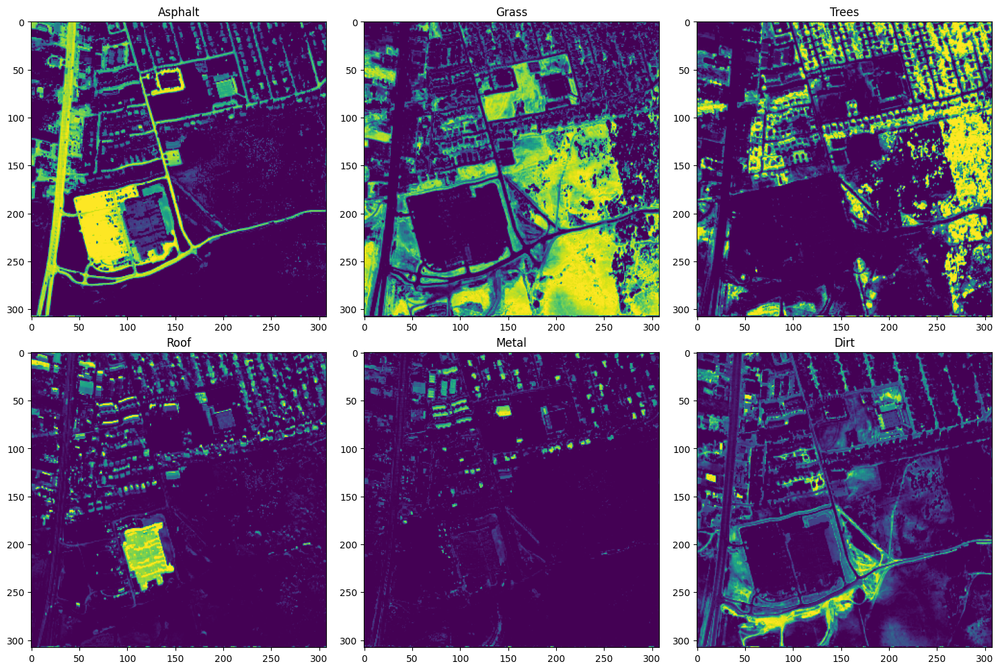

Endmembers:


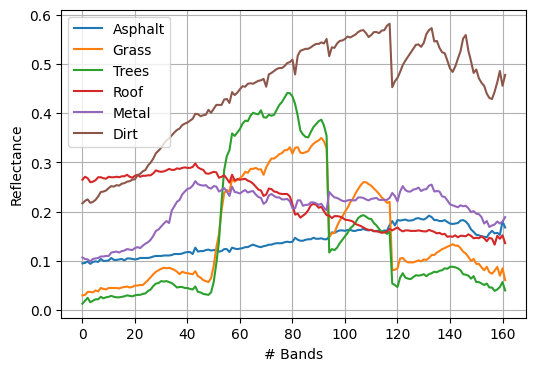

Image:


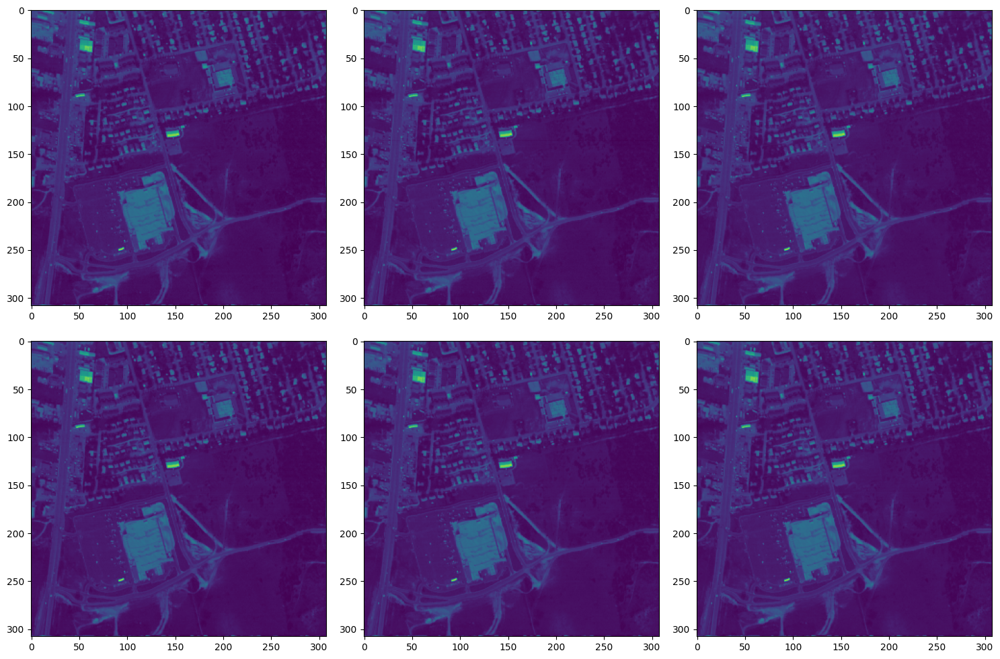

E@A:


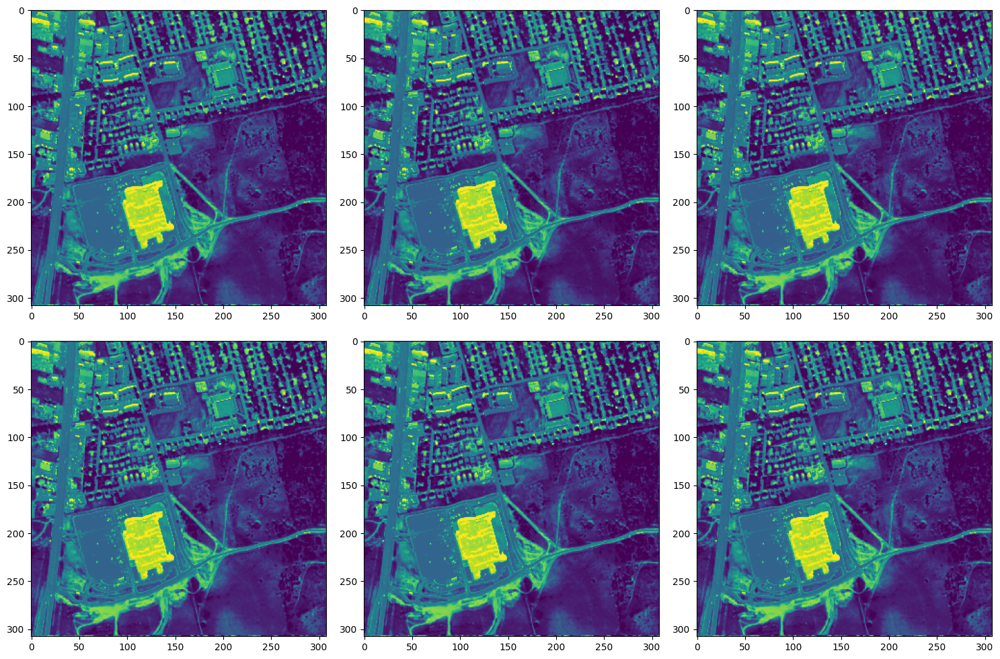

In [10]:
plot_image(A_gt_tensor, E_tensor, Y_tensor, r_channels, n_bands, n, m, a_names)

# Model

In [6]:
# UnDIP model
encoder_channels = [256,256]
decoder_channels = [256,256,r_channels]
skip_channels = 4

# Define the network architecture
class Undip_net_paper(nn.Module):
  def __init__(self):
    super(Undip_net_paper, self).__init__()

    self.encoder1 = nn.Sequential(nn.Conv2d(r_channels, encoder_channels[0], (3, 3),
                                            stride=(2, 2), padding_mode='reflect', padding=1, dilation=1), # (308,308) to (154,154)
                                  nn.BatchNorm2d(encoder_channels[0]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1),
    )

    self.encoder2 = nn.Sequential(nn.Conv2d(encoder_channels[0], encoder_channels[1], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(encoder_channels[1]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1), # (154,154)
    )

    self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')


    self.skip = nn.Sequential(nn.Conv2d(r_channels, skip_channels, (1, 1), stride=(1, 1),
                                        padding=0, dilation=1),
                              nn.BatchNorm2d(skip_channels),
                              nn.LeakyReLU(inplace=True, negative_slope=0.1),
    )



    self.decoder1 = nn.Sequential(nn.BatchNorm2d(encoder_channels[1]+skip_channels),
                                  nn.Conv2d(encoder_channels[1]+skip_channels, decoder_channels[0],
                                            (3, 3), stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(decoder_channels[0]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1)
    )



    self.decoder2 = nn.Sequential(nn.Conv2d(decoder_channels[0], decoder_channels[1], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(decoder_channels[1]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1), # (77,77)
    )

    self.decoder3 = nn.Sequential(nn.Conv2d(decoder_channels[1], decoder_channels[2], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.Softmax(dim=1)
    )


  def forward(self, input):


    current_feature = self.encoder1(input)
    current_feature = self.encoder2(current_feature)
    current_feature = self.upsample(current_feature)

    current_skip_output = self.skip(input)

    current_feature = torch.cat((current_feature,current_skip_output), dim=1)


    current_feature = self.decoder1(current_feature)
    current_feature = self.decoder2(current_feature)
    output = self.decoder3(current_feature)


    return output

In [7]:
# Training algorithm
def train(model, input, E_tensor, Y_tensor, Y_noise, A_gt_tensor, epochs, lr, optimizer):

    # Loss function
    criterion = nn.MSELoss()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    input = input.to(device)
    criterion = criterion.to(device)
    E_tensor = E_tensor.to(device)
    Y_tensor = Y_tensor.to(device)
    Y_noise = Y_noise.to(device)
    A_gt_tensor = A_gt_tensor.to(device)

    history = {'losses': [],
               'spectralMSE': [],
               'MAE': [],
               'avg_MAE': []}

    # For weighted average
    out_avg = None

    model.eval() if optimizer is None else model.train()
    for epoch in range(1, epochs + 1):

        model.train()

        optimizer.zero_grad()

        output = model(input)

        loss = criterion(torch.mm(E_tensor, output.view(r_channels, n*m)), Y_noise)

        # Weighted average
        if out_avg is None:
            out_avg = output
        else:
            out_avg =  out_avg * 0.99 + output * 0.01

        print('Epoch {}: '.format(epoch), loss.item())
        history['losses'].append(loss.item())
        history['spectralMSE'].append(nn.MSELoss()(torch.mm(E_tensor,
                                                            output.view(r_channels, n*m)),
                                                   Y_tensor).item())
        history['MAE'].append(nn.L1Loss()(output, A_gt_tensor.view([1,r_channels,n,m])).item())
        history['avg_MAE'].append(nn.L1Loss()(out_avg,
                                              A_gt_tensor.view([1,r_channels,n,m])).item())

        loss.backward()
        optimizer.step()

    return output, history

# First results

In [11]:
# Hyperparameters
Undip_model = Undip_net_paper()
lr = 0.001
epochs = 3000
optimizer = optim.Adam(Undip_model.parameters(), lr=lr)
snr = 10

In [12]:
# Random initialisation of A
A = torch.normal(0,1,size=(1,r_channels,n,m), dtype=torch.float32)

In [13]:
# No noise
Y_noise = Y_tensor.clone()

# With noise
#Y_noise = add_noise(Y_tensor, snr)

In [14]:
# Training
output, history = train(Undip_model, A, E_tensor, Y_tensor,
                        Y_noise, A_gt_tensor, epochs, lr, optimizer)

Epoch 1:  0.012112610042095184
Epoch 2:  0.009069153107702732
Epoch 3:  0.008789090439677238
Epoch 4:  0.008556928485631943
Epoch 5:  0.008235795423388481
Epoch 6:  0.007576765026897192
Epoch 7:  0.006983352359384298
Epoch 8:  0.006811659783124924
Epoch 9:  0.006653473246842623
Epoch 10:  0.0067081935703754425
Epoch 11:  0.006145518738776445
Epoch 12:  0.005962431896477938
Epoch 13:  0.0055837808176875114
Epoch 14:  0.005354223772883415
Epoch 15:  0.00520487641915679
Epoch 16:  0.005060206633061171
Epoch 17:  0.004847969394177198
Epoch 18:  0.0046907952055335045
Epoch 19:  0.004539242945611477
Epoch 20:  0.0044245305471122265
Epoch 21:  0.004303081892430782
Epoch 22:  0.004179284442216158
Epoch 23:  0.004091939423233271
Epoch 24:  0.003996220417320728
Epoch 25:  0.0039269039407372475
Epoch 26:  0.0038373428396880627
Epoch 27:  0.0037677716463804245
Epoch 28:  0.0036911515053361654
Epoch 29:  0.003624752163887024
Epoch 30:  0.0035530924797058105
Epoch 31:  0.0034897620789706707
Epoch 32

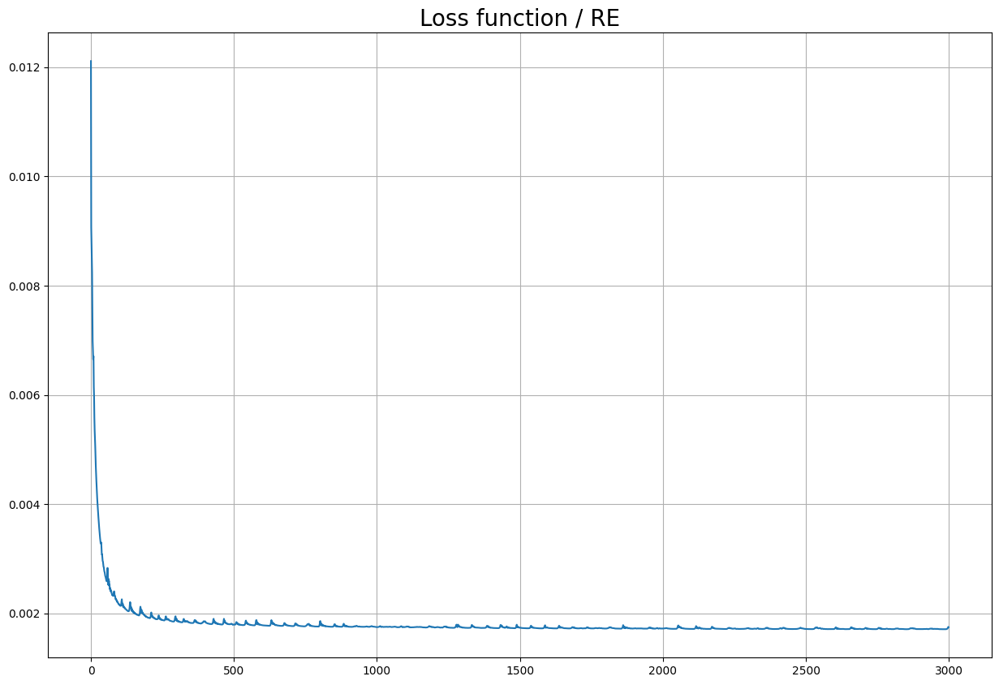

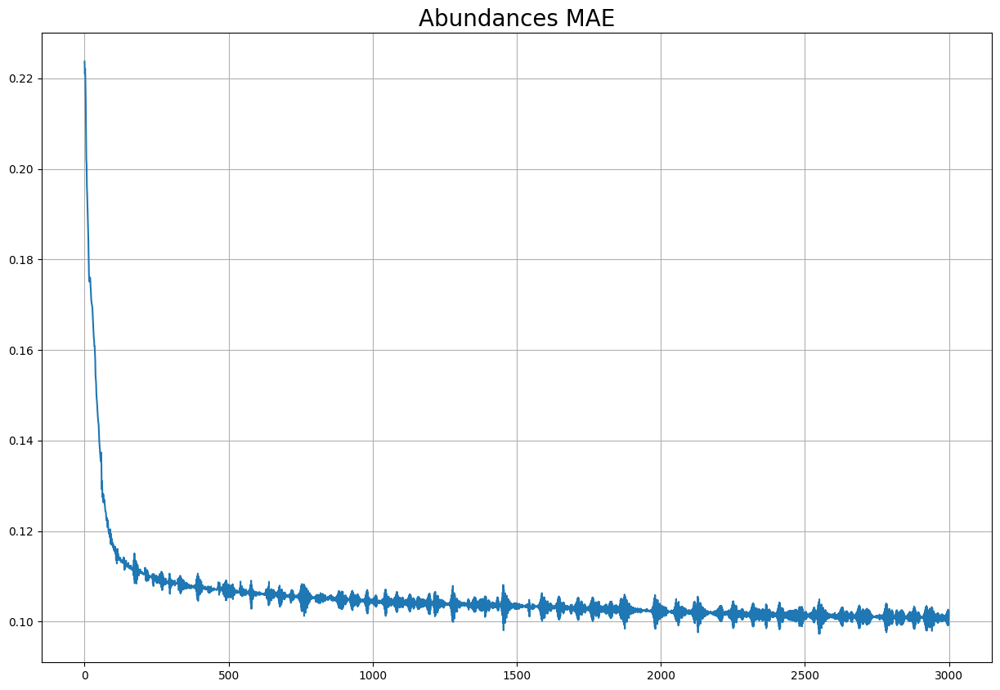

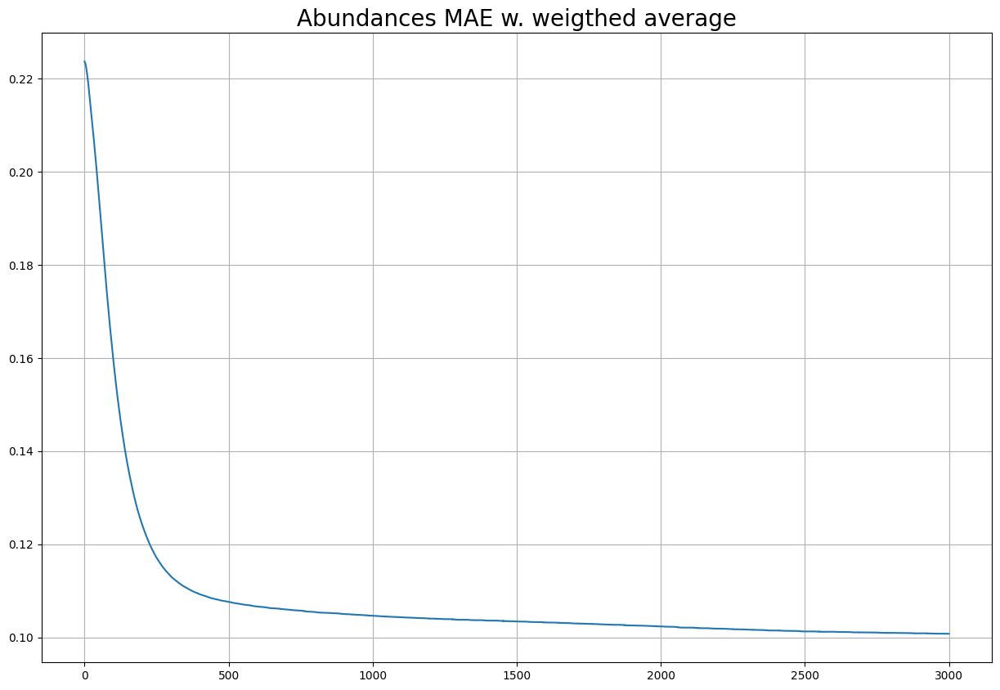

In [15]:
# Evolution of metrics
def plot_history(history, w_avg=False):
    plt.figure(figsize=(15,10))
    plt.title('Loss function / RE', fontsize='20')
    plt.plot(history['losses'])
    plt.grid()
    plt.show()
    plt.figure(figsize=(15,10))
    plt.title('Abundances MAE', fontsize='20')
    plt.plot(history['MAE'])
    plt.grid()
    plt.show()
    plt.figure(figsize=(15,10))
    plt.title('Abundances MAE w. weigthed average', fontsize='20')
    plt.plot(history['avg_MAE'])
    plt.grid()
    plt.show()

plot_history(history)

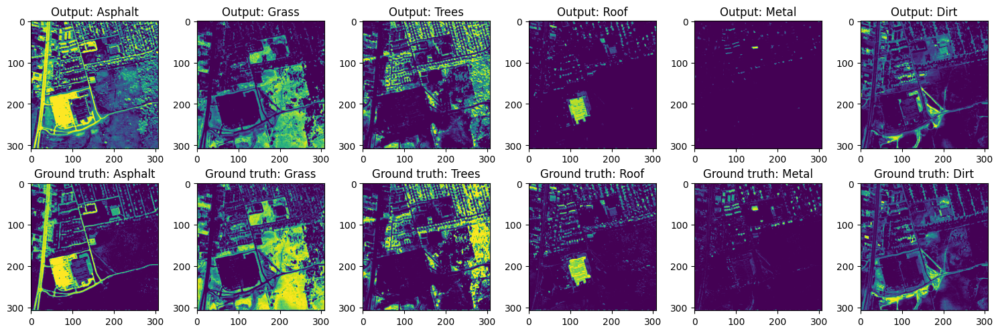

In [18]:
# View results
def view_results(r_channels, A, A_gt_tensor):
    plt.figure(figsize=(15,5))
    for i in range(r_channels):
        ax = plt.subplot(2, r_channels, i+1)
        im = A.cpu().detach()[0, i,:,:]
        ax.imshow(im)
        plt.title('Output: {}'.format(a_names[i]))

    for i in range(r_channels):
        ax = plt.subplot(2, r_channels, i+1+r_channels)
        im = A_gt_tensor.view([1,r_channels,n,m])[0,i,:,:]
        ax.imshow(im)
        plt.title('Ground truth: {}'.format(a_names[i]))

    plt.tight_layout()
    plt.show()

view_results(r_channels, output, A_gt_tensor)

# Optimizer and Learning rate

In [38]:
Optim_tests = {}

# Directly load test results
#file_path = './output/Optim_tests.pkl'
#with open(file_path, "rb") as pickle_file:
#      Optim_tests = pickle.load(pickle_file)

In [20]:
# Tests

epochs = 750
Test_values = {'optimizer': ['Adam', 'Adam', 'Adam', 'NAdam', 'RMSProp', 'NAdam', 'NAdam'],
               'learning_rate': [0.001, 0.01, 0.005, 0.001, 0.01, 0.0005, 0.0001]}

for k in range(len(Test_values['optimizer'])):
    # Hyperparameters
    Undip_model = Undip_net_paper()
    lr = Test_values['learning_rate'][k]
    o = Test_values['optimizer'][k]
    if o == 'Adam':
        optimizer = optim.Adam(Undip_model.parameters(), lr=lr)
    elif o == 'NAdam':
        optimizer = optim.NAdam(Undip_model.parameters(), lr=lr)
    else:
        optimizer = optim.RMSprop(Undip_model.parameters(), lr=lr)

    # Initialisation
    A = torch.normal(0,1,size=(1,r_channels,n,m), dtype=torch.float32)
    # No noise
    Y_noise = Y_tensor.clone()
    # Training
    output, history = train(Undip_model,A, E_tensor, Y_tensor,
                        Y_noise, A_gt_tensor, epochs, lr, optimizer)
    # Save results
    Optim_tests['{}_{}'.format(o, lr)] = output, history

Streaming output truncated to the last 5000 lines.
Epoch 251:  0.0019033547723665833
Epoch 252:  0.0019059997284784913
Epoch 253:  0.0019064913503825665
Epoch 254:  0.0018979315645992756
Epoch 255:  0.0018983646295964718
Epoch 256:  0.0018965094350278378
Epoch 257:  0.0018885801546275616
Epoch 258:  0.0018881475552916527
Epoch 259:  0.0018925771582871675
Epoch 260:  0.0018904049647971988
Epoch 261:  0.0018856311216950417
Epoch 262:  0.0018883257871493697
Epoch 263:  0.001892629312351346
Epoch 264:  0.0018941633170470595
Epoch 265:  0.001897353446111083
Epoch 266:  0.0019068463006988168
Epoch 267:  0.0019101889338344336
Epoch 268:  0.0019088619155809283
Epoch 269:  0.0018949408549815416
Epoch 270:  0.00188727758359164
Epoch 271:  0.0018922206945717335
Epoch 272:  0.0018979907035827637
Epoch 273:  0.0019019425380975008
Epoch 274:  0.0019107589032500982
Epoch 275:  0.0019274562364444137
Epoch 276:  0.0019438135204836726
Epoch 277:  0.0019381428137421608
Epoch 278:  0.0019259441178292036
E

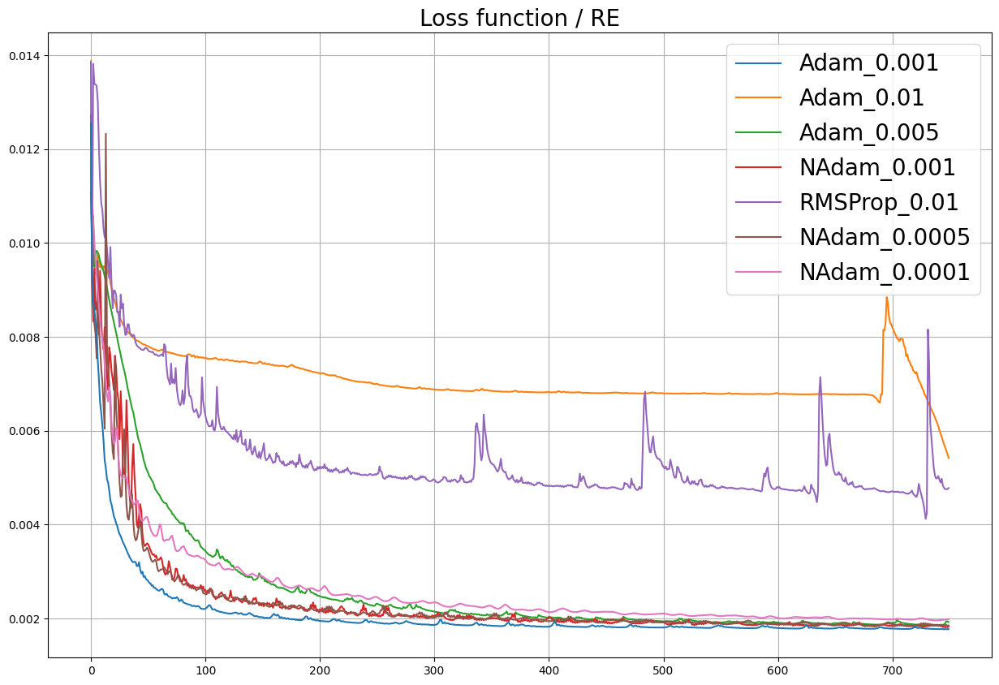

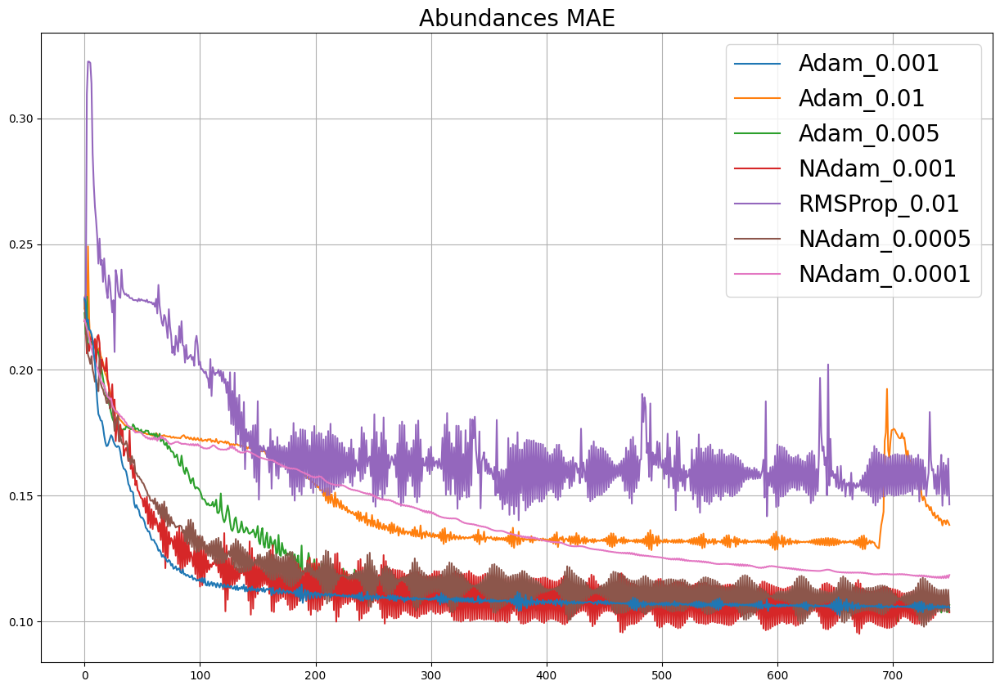

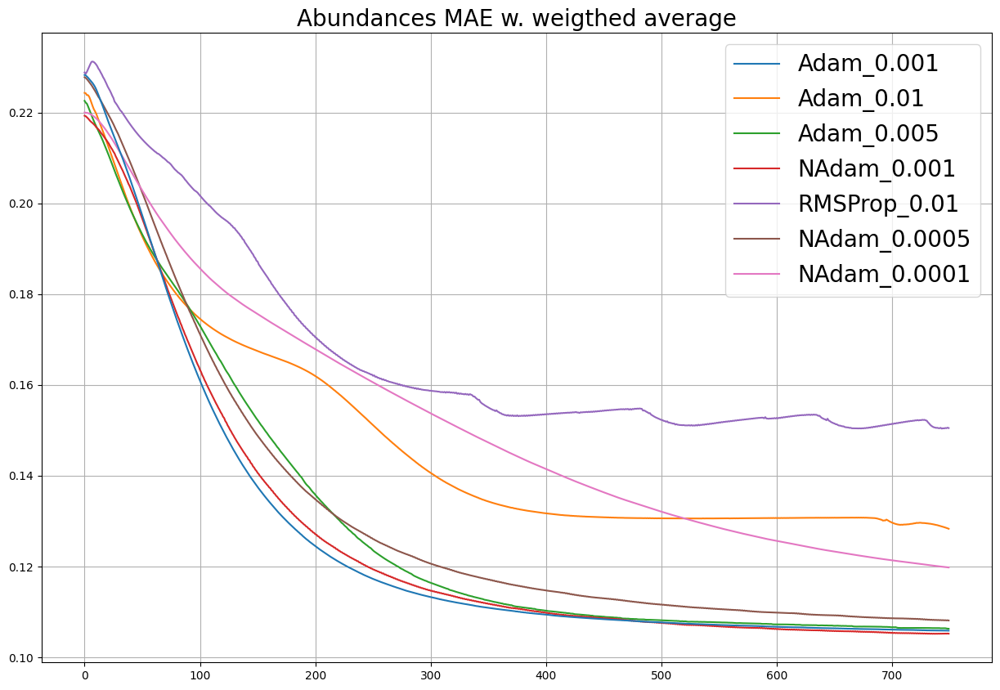

In [21]:
# Plot metrics

l = list(Optim_tests.keys())

# Plot loss function
plt.figure(figsize=(15,10))
plt.plot(Optim_tests[l[0]][1]['losses'], label=l[0], zorder=10)
for key in l[1:]:
  plt.plot(Optim_tests[key][1]['losses'], label=key)

plt.grid()
plt.title('Loss function / RE', fontsize='20')
plt.legend(fontsize='20')
plt.show()

# Plot Abundances MAE
plt.figure(figsize=(15,10))
plt.plot(Optim_tests[l[0]][1]['MAE'], label=l[0], zorder=10)
for key in l[1:]:
  plt.plot(Optim_tests[key][1]['MAE'], label=key)

plt.grid()
plt.title('Abundances MAE', fontsize='20')
plt.legend(fontsize='20')
plt.show()

# Plot Abundances MAE w. weigthed average
plt.figure(figsize=(15,10))
plt.plot(Optim_tests[l[0]][1]['avg_MAE'], label=l[0], zorder=10)
for key in l[1:]:
  plt.plot(Optim_tests[key][1]['avg_MAE'], label=key)

plt.grid()
plt.title('Abundances MAE w. weigthed average', fontsize='20')
plt.legend(fontsize='20')
plt.show()

# Robustness to noise

In [22]:
# Add noise to Y with a certain SNR
def add_noise(Y_tensor, snr):
    sigma = torch.sqrt(torch.mean(Y_tensor**2)/snr)
    noise = torch.normal(0,sigma,size=Y_tensor.shape, dtype=torch.float32)
    return Y_tensor + noise

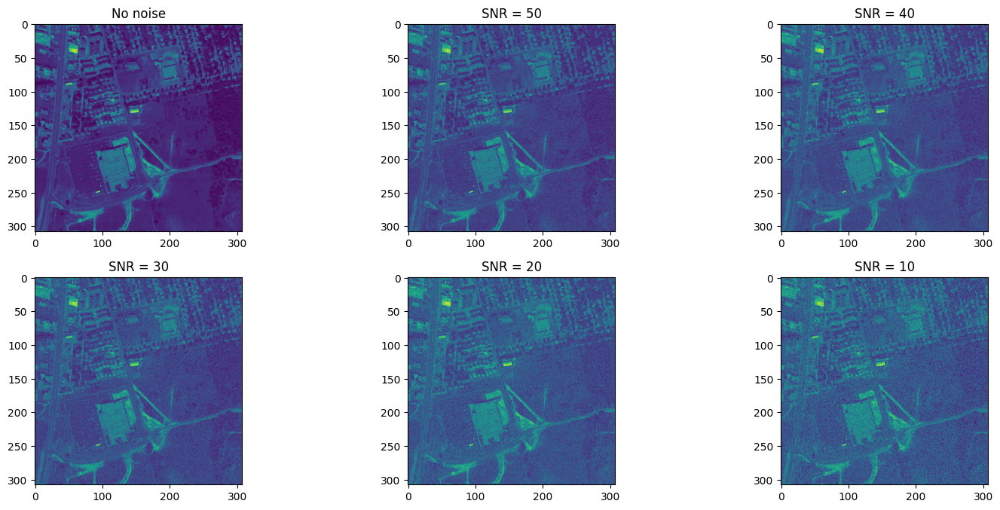

In [23]:
# View different level of noise on Y
Y_noise1 = add_noise(Y_tensor, 10)
Y_noise2 = add_noise(Y_tensor, 20)
Y_noise3 = add_noise(Y_tensor, 30)
Y_noise4 = add_noise(Y_tensor, 40)
Y_noise5 = add_noise(Y_tensor, 50)

plt.figure(figsize=(15,10))

plt.subplot(3, 3, 1)
plt.imshow((Y_tensor).reshape(n_bands,n,m)[50,:,:])
plt.title('No noise')
plt.subplot(3, 3, 2)
plt.imshow((Y_noise5).reshape(n_bands,n,m)[50,:,:])
plt.title('SNR = 50')
plt.subplot(3, 3, 3)
plt.imshow((Y_noise4).reshape(n_bands,n,m)[50,:,:])
plt.title('SNR = 40')
plt.subplot(3, 3, 4)
plt.imshow((Y_noise3).reshape(n_bands,n,m)[50,:,:])
plt.title('SNR = 30')
plt.subplot(3, 3, 5)
plt.imshow((Y_noise2).reshape(n_bands,n,m)[50,:,:])
plt.title('SNR = 20')
plt.subplot(3, 3, 6)
plt.imshow((Y_noise1).reshape(n_bands,n,m)[50,:,:])
plt.title('SNR = 10')

plt.tight_layout()
plt.show()

In [24]:
Noise_tests = {}

# Directly load test results
#file_path = './output/Noise_tests.pkl'
#with open(file_path, "rb") as pickle_file:
#      Noise_tests = pickle.load(pickle_file)

In [26]:
# Tests

lr = 0.001
epochs = 1000
SNR_values = [0, 50, 40, 30, 20, 10]

for k in range(len(SNR_values)):
    # Hyperparameters
    Undip_model = Undip_net_paper()
    optimizer = optim.Adam(Undip_model.parameters(), lr=lr)
    snr = SNR_values[k]


    # Initialisation
    A = torch.normal(0,1,size=(1,r_channels,n,m), dtype=torch.float32)
    # Add Noise
    if snr == 0:
        Y_noise = Y_tensor.clone()
    else:
        Y_noise = add_noise(Y_tensor, snr)
    # Training
    output, history = train(Undip_model,A, E_tensor, Y_tensor,
                        Y_noise, A_gt_tensor, epochs, lr, optimizer)
    # Save results
    if snr == 0:
        Noise_tests['No noise'] = output, history
    else:
        Noise_tests['SNR = {}'.format(snr)] = output, history

Streaming output truncated to the last 5000 lines.
Epoch 1:  0.014631654135882854
Epoch 2:  0.010328656993806362
Epoch 3:  0.009862787090241909
Epoch 4:  0.00954822264611721
Epoch 5:  0.009543509222567081
Epoch 6:  0.009191052988171577
Epoch 7:  0.009016347117722034
Epoch 8:  0.00876493938267231
Epoch 9:  0.008454003371298313
Epoch 10:  0.008119848556816578
Epoch 11:  0.00782732479274273
Epoch 12:  0.007619576063007116
Epoch 13:  0.007444364950060844
Epoch 14:  0.00727893365547061
Epoch 15:  0.007157954387366772
Epoch 16:  0.007089799735695124
Epoch 17:  0.00694363983348012
Epoch 18:  0.006843828596174717
Epoch 19:  0.006782583426684141
Epoch 20:  0.00671461271122098
Epoch 21:  0.006642569322139025
Epoch 22:  0.00660068541765213
Epoch 23:  0.0065299649722874165
Epoch 24:  0.006495968904346228
Epoch 25:  0.00642771739512682
Epoch 26:  0.006380637641996145
Epoch 27:  0.006333336699754
Epoch 28:  0.006283624097704887
Epoch 29:  0.006223686970770359
Epoch 30:  0.0061518410220742226
Epoch 3

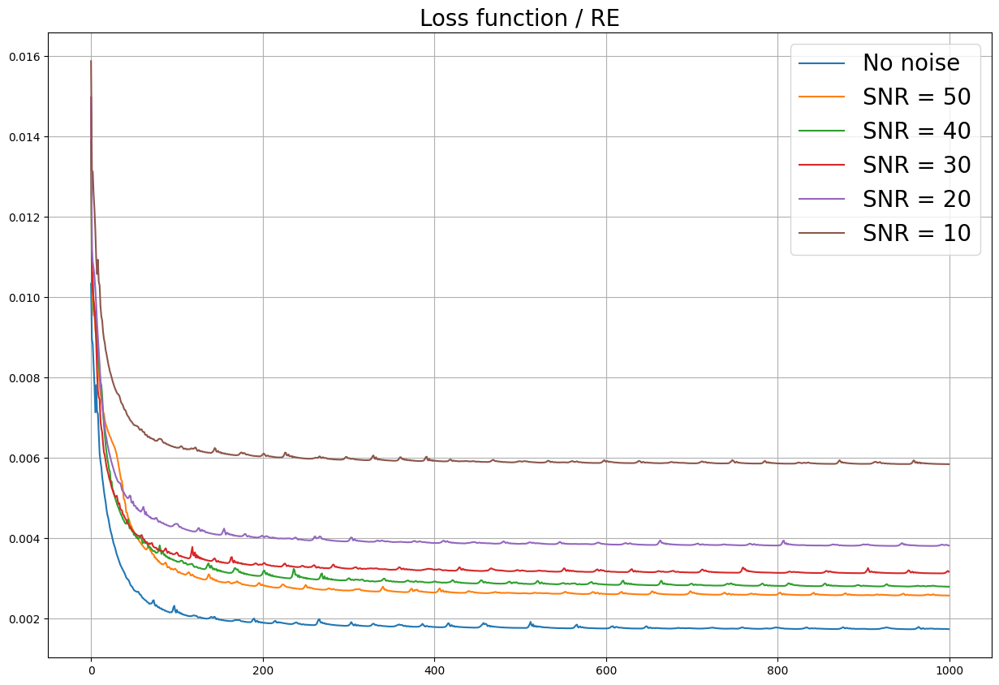

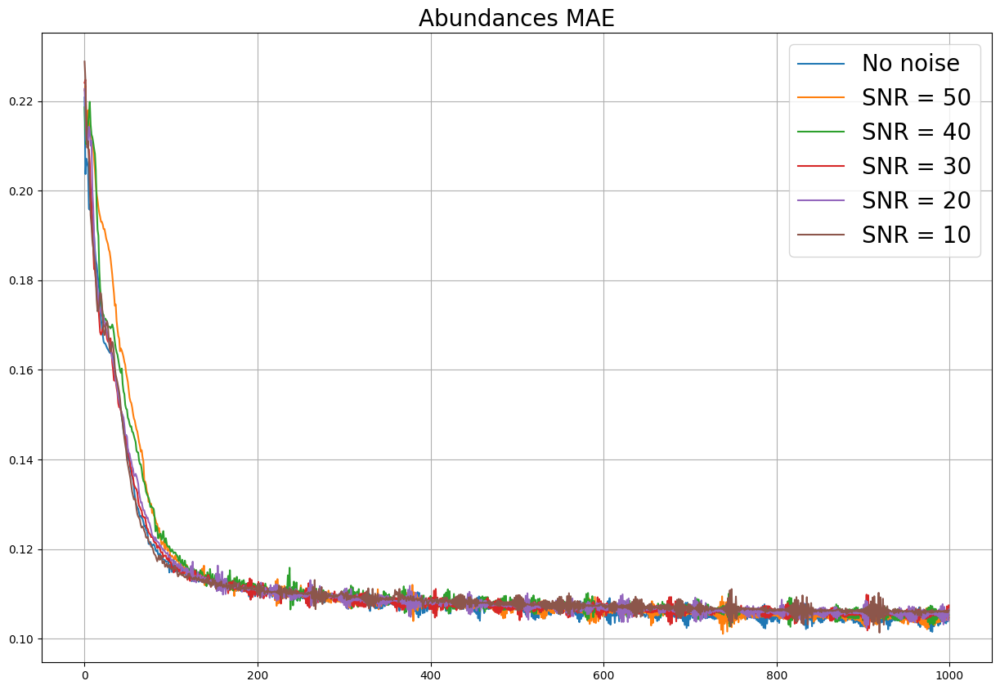

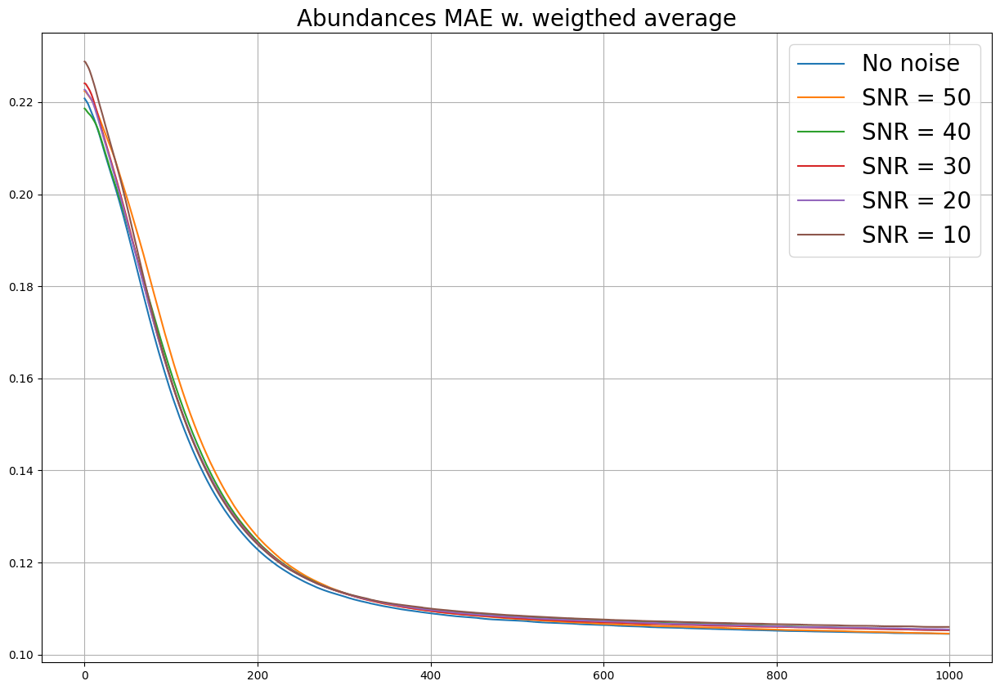

In [27]:
# Plot metrics

l = list(Noise_tests.keys())

# Plot loss function
plt.figure(figsize=(15,10))
for key in l:
    plt.plot(Noise_tests[key][1]['losses'], label=key)

plt.grid()
plt.title('Loss function / RE', fontsize='20')
plt.legend(fontsize='20')
plt.show()

# Plot Abundances MAE
plt.figure(figsize=(15,10))
for key in l:
    plt.plot(Noise_tests[key][1]['MAE'], label=key)

plt.grid()
plt.title('Abundances MAE', fontsize='20')
plt.legend(fontsize='20')
plt.show()

# Plot Abundances MAE w. weigthed average
plt.figure(figsize=(15,10))
for key in l:
    plt.plot(Noise_tests[key][1]['avg_MAE'], label=key)

plt.grid()
plt.title('Abundances MAE w. weigthed average', fontsize='20')
plt.legend(fontsize='20')
plt.show()

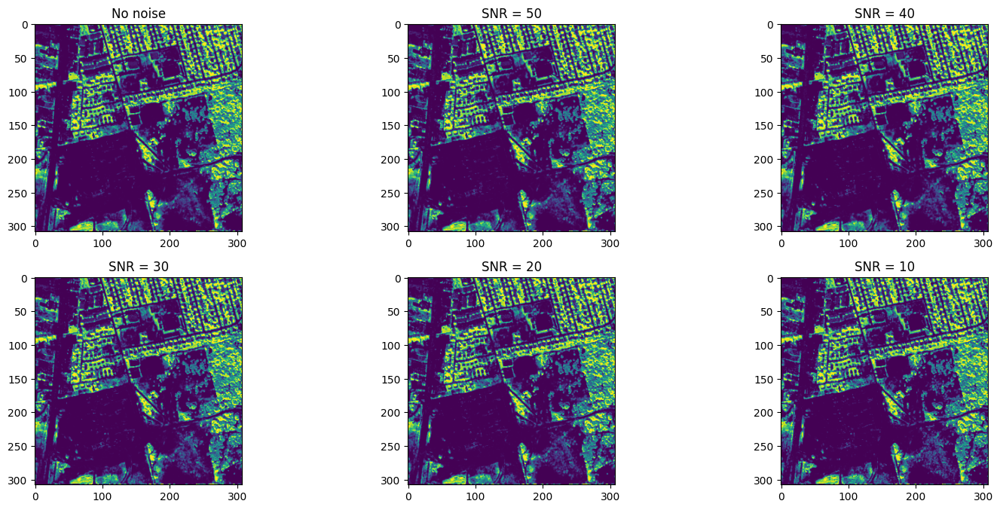

In [32]:
# View abundances

abundance_slice = 2

A_noise0 = Noise_tests['No noise'][0].detach().cpu()
A_noise1 = Noise_tests['SNR = 50'][0].detach().cpu()
A_noise2 = Noise_tests['SNR = 40'][0].detach().cpu()
A_noise3 = Noise_tests['SNR = 30'][0].detach().cpu()
A_noise4 = Noise_tests['SNR = 20'][0].detach().cpu()
A_noise5 = Noise_tests['SNR = 10'][0].detach().cpu()

plt.figure(figsize=(15,10))

plt.subplot(3, 3, 1)
plt.imshow(A_noise0[0,abundance_slice,:,:])
plt.title('No noise')
plt.subplot(3, 3, 2)
plt.imshow(A_noise1[0,abundance_slice,:,:])
plt.title('SNR = 50')
plt.subplot(3, 3, 3)
plt.imshow(A_noise2[0,abundance_slice,:,:])
plt.title('SNR = 40')
plt.subplot(3, 3, 4)
plt.imshow(A_noise3[0,abundance_slice,:,:])
plt.title('SNR = 30')
plt.subplot(3, 3, 5)
plt.imshow(A_noise4[0,abundance_slice,:,:])
plt.title('SNR = 20')
plt.subplot(3, 3, 6)
plt.imshow(A_noise5[0,abundance_slice,:,:])
plt.title('SNR = 10')

plt.tight_layout()
plt.show()

In [36]:
# Save results
file_path = './output/Noise_tests.pkl'
with open(file_path, "wb") as pickle_file:
      pickle.dump(Noise_tests, pickle_file)


file_path = './output/Optim_tests.pkl'
with open(file_path, "wb") as pickle_file:
      pickle.dump(Optim_tests, pickle_file)